Задача этого проекта — научить модель предсказывать, насколько успешным будет бизнес (кафе,
магазин, заправка и т.д.) в определённом месте.

Цель

Нужно создать модель, которая, анализируя данные о местоположении (что находится рядом: парки, школы, дороги,
конкуренты), сможет предсказать общую сумму выручки (транзакций) для новой точки бизнеса.

Данные  



1. train.parquet:
    * Содержит бизнес-показатели для существующих точек.
    * Ключевые поля: тип бизнеса, количество клиентов, число транзакций и, самое главное, — сумма транзакций
      (transaction_sum), которую и нужно предсказывать.

2. geo_data.parquet:
    * Содержит географические данные для каждой локации.
    * Ключевые поля: широта и долгота, а также информация о том, сколько и как далеко находятся различные объекты
      (банки, кафе, остановки, парковки и т.д.).

Связь между файлами: Данные из обоих файлов связаны через специальный географический индекс h3_index, который
уникально определяет каждую локацию.

In [1]:
!pip install -U -qq plotly[express] catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 76.5 MB/s eta 0:00:00


## Загрузка данных

In [2]:
!gdown 1kBpgwCBfnnMbjVN-i8LPKOhzpbqlnhWV
!gdown 1zKE2A2Jy5A_jQaLQxjtiWrIccpIIlxnl

Downloading...
From (original): https://drive.google.com/uc?id=1kBpgwCBfnnMbjVN-i8LPKOhzpbqlnhWV
From (redirected): https://drive.google.com/uc?id=1kBpgwCBfnnMbjVN-i8LPKOhzpbqlnhWV&confirm=t&uuid=195d46cb-3136-44b1-bc5a-a5ece92761a8
To: /content/geo_data.parquet
100% 217M/217M [00:02<00:00, 79.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1zKE2A2Jy5A_jQaLQxjtiWrIccpIIlxnl
To: /content/train.parquet
100% 6.09M/6.09M [00:00<00:00, 36.6MB/s]


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff

# import h3
# import pydeck as pdk

import warnings
warnings.filterwarnings('ignore')


In [4]:
from sklearn.model_selection import train_test_split
geo_data = pd.read_parquet('geo_data.parquet')
data = pd.read_parquet("train.parquet")

merged = pd.merge(data, geo_data, how="left", on="h3_index")

train, test = train_test_split(merged, train_size=0.6, random_state=56)
val, test = train_test_split(test, test_size=0.5, random_state=56)

train.shape, val.shape, test.shape

((172513, 344), (57504, 344), (57505, 344))

In [5]:
from sklearn.metrics import mean_absolute_error

# Метрика соревы
def mae_log10(y_true, y_pred):
    y_true = np.maximum(y_true, 0)
    y_pred = np.maximum(y_pred, 0)
    return mean_absolute_error(np.log10(y_true + 1), np.log10(y_pred + 1))

# Предварительный скор для лб
def score(y_true, y_pred):
    return 1 / (1 + mae_log10(y_true, y_pred))

## EDA

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 172513 entries, 244144 to 261973
Columns: 344 entries, h3_index to osm_transportation_count_500
dtypes: float64(115), int64(227), object(2)
memory usage: 454.1+ MB


In [7]:
train.head(10)

,h3_index,industry_type,transaction_count,customer_count,objects_count,transaction_sum,lat,lon,osm_accommodation_closest,osm_accommodation_closest_5_mean,...,osm_tourism_hotel_count_100,osm_tourism_hotel_count_1000,osm_tourism_hotel_count_2000,osm_tourism_hotel_count_500,osm_transportation_closest,osm_transportation_closest_5_mean,osm_transportation_count_100,osm_transportation_count_1000,osm_transportation_count_2000,osm_transportation_count_500
244144,892c2dc5173ffff,napitki_tabak,318,95,1,1.412610e+05,43.482266,43.565629,NaN,NaN,...,0,0,0,0,268.057708,463.000761,0,14,48,3
192654,8910f1ad367ffff,napitki_tabak,7472,1403,2,2.991216e+06,58.009099,56.301512,NaN,NaN,...,0,2,3,0,118.601265,122.559727,0,114,364,36
104306,892141d4aa3ffff,other,379,80,1,1.047020e+05,54.856010,73.417961,NaN,NaN,...,0,0,1,0,662.756740,911.074451,0,4,16,0
121094,89119ed897bffff,medicina,7529,3797,4,9.174335e+06,51.689367,39.182690,NaN,NaN,...,0,1,6,1,34.080428,57.033271,6,51,286,17
47161,8910f52864fffff,other,9512,2487,4,1.022168e+07,58.054607,54.638895,NaN,NaN,...,0,0,0,0,482.887120,1547.996928,0,1,4,1
209154,8910c20e0afffff,clothes,189,168,1,7.140500e+05,56.885990,59.892627,NaN,NaN,...,0,0,0,0,97.310373,123.958884,2,42,63,10
180806,8910f1ad047ffff,clothes,195,131,3,1.641976e+06,58.013717,56.245963,NaN,NaN,...,0,26,32,12,24.015065,57.540479,3,209,563,47
181251,8910ad16047ffff,other,249,30,1,5.010490e+04,56.997252,48.743113,NaN,NaN,...,0,1,1,1,81.564706,87.265179,4,14,19,10
276643,89212d8f38fffff,other,413,56,2,1.722424e+05,54.373837,61.528077,NaN,NaN,...,0,0,0,0,11978.563761,12276.797958,0,0,0,0
38482,8910add30bbffff,clothes,6884,4719,7,9.174878e+06,56.639950,47.850388,NaN,NaN,...,0,2,4,0,90.536234,193.740448,2,100,237,16


In [8]:
train.transaction_sum.quantile(0.25), train.transaction_sum.quantile(0.75)

(np.float64(94028.0), np.float64(2179483.8517899998))

Visualizing the distribution of 'transaction_sum':


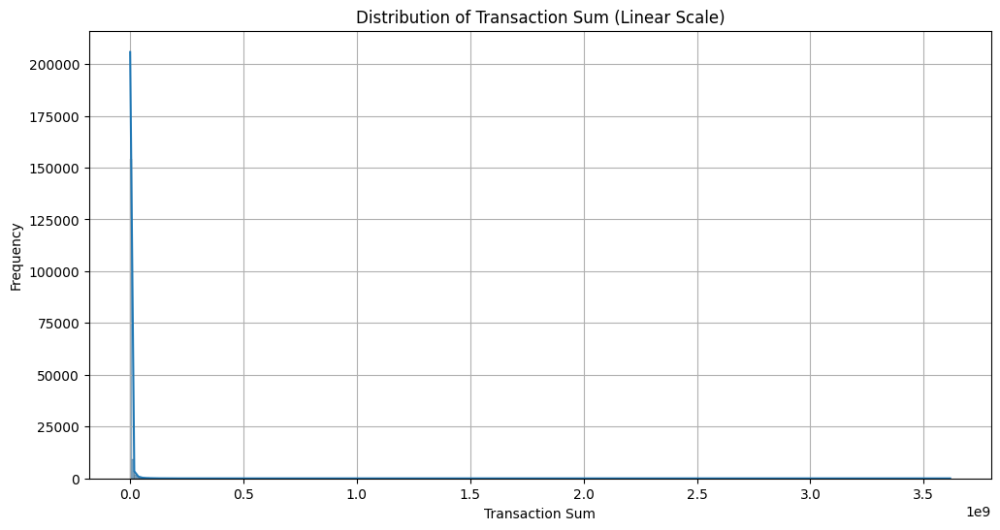

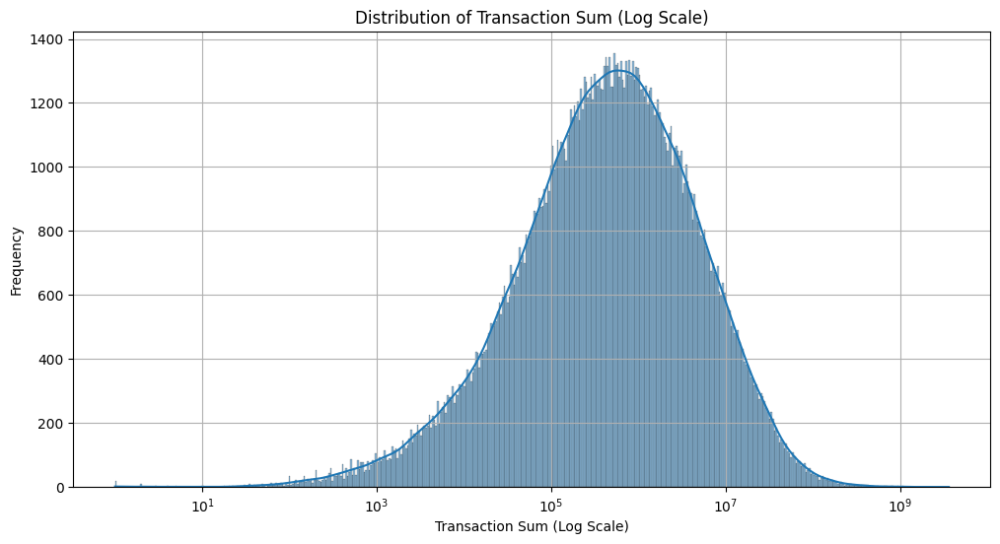

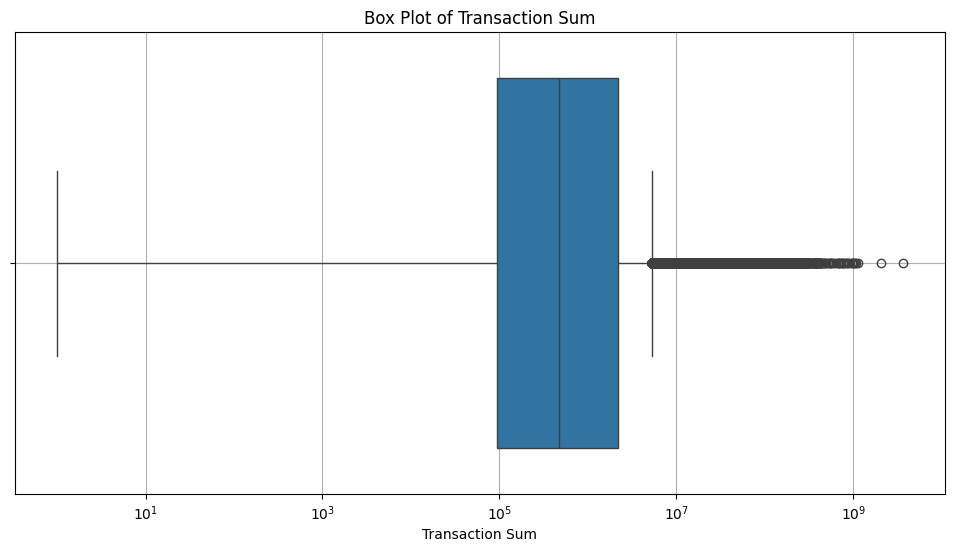

In [9]:
print("Visualizing the distribution of 'transaction_sum':")

# Histogram
plt.figure(figsize=(12, 6))
sns.histplot(train['transaction_sum'], bins=500, kde=True)
plt.title('Distribution of Transaction Sum (Linear Scale)')
plt.xlabel('Transaction Sum')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Histogram with log scale for better visibility of skewed data
plt.figure(figsize=(12, 6))
sns.histplot(train['transaction_sum'], bins=500, kde=True, log_scale=True)
plt.title('Distribution of Transaction Sum (Log Scale)')
plt.xlabel('Transaction Sum (Log Scale)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x=train['transaction_sum'])
plt.title('Box Plot of Transaction Sum')
plt.xlabel('Transaction Sum')
plt.xscale('log') # Use log scale for box plot as well due to potential outliers
plt.grid(True)
plt.show()

In [10]:
missing_values = train.isnull().sum()
missing_percentage = (missing_values / len(train)) * 100

missing_info = pd.DataFrame({
    'Missing Count': missing_values,
    'Missing Percentage': missing_percentage
})

missing_info = missing_info[missing_info['Missing Count'] > 0].sort_values(by='Missing Percentage', ascending=False)

display(missing_info)

,Missing Count,Missing Percentage
osm_accommodation_closest,172513,100.000000
osm_accommodation_closest_5_mean,172513,100.000000
osm_cars_closest_5_mean,172513,100.000000
osm_cars_closest,172513,100.000000
osm_sports_closest,172513,100.000000
osm_sports_closest_5_mean,172513,100.000000
osm_education_closest,111365,64.554555
osm_education_closest_5_mean,111365,64.554555
osm_adult_closest,39987,23.179123
osm_adult_closest_5_mean,39987,23.179123


Visualizing the distribution of 'industry_type':


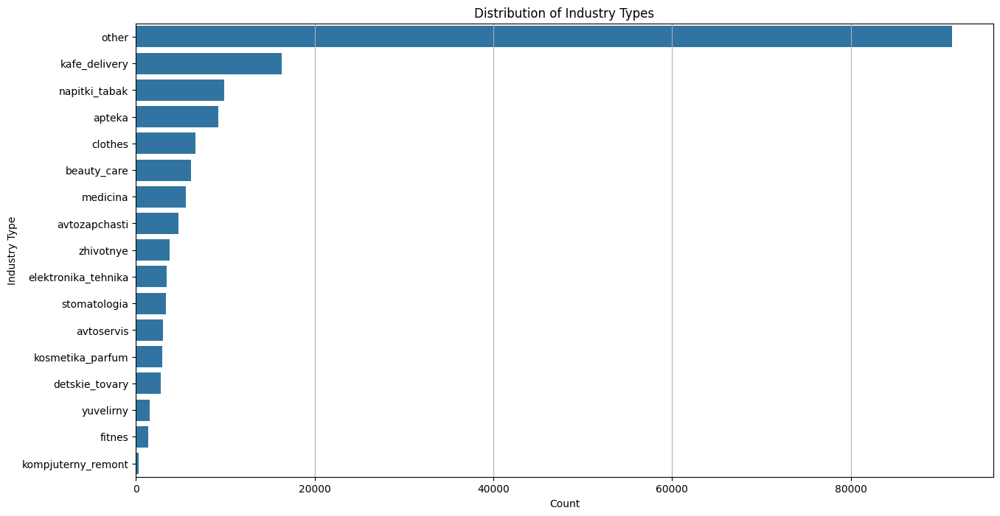

In [11]:
print("Visualizing the distribution of 'industry_type':")

plt.figure(figsize=(15, 8))
sns.countplot(data=train, y='industry_type', order = train['industry_type'].value_counts().index)
plt.title('Distribution of Industry Types')
plt.xlabel('Count')
plt.ylabel('Industry Type')
plt.grid(axis='x')
plt.show()

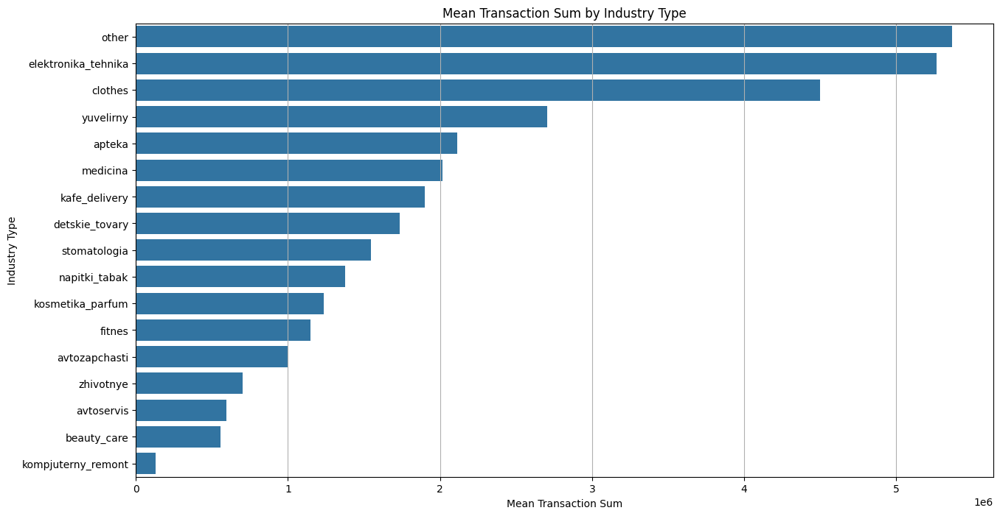

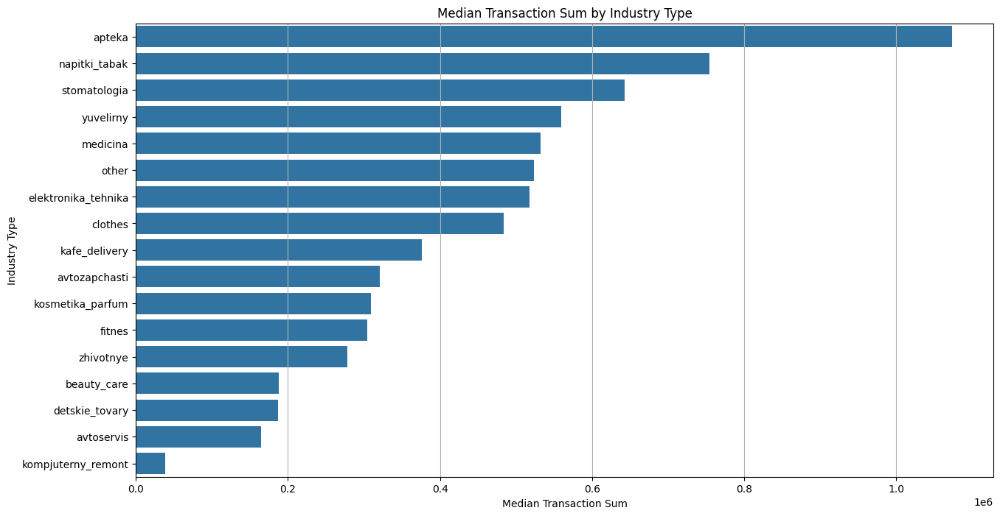

In [12]:
mean_transaction_by_industry = train.groupby('industry_type')['transaction_sum'].mean().sort_values(ascending=False)

plt.figure(figsize=(15, 8))
sns.barplot(x=mean_transaction_by_industry.values, y=mean_transaction_by_industry.index)
plt.title('Mean Transaction Sum by Industry Type')
plt.xlabel('Mean Transaction Sum')
plt.ylabel('Industry Type')
plt.grid(axis='x')
plt.show()

median_transaction_by_industry = train.groupby('industry_type')['transaction_sum'].median().sort_values(ascending=False)

plt.figure(figsize=(15, 8))
sns.barplot(x=median_transaction_by_industry.values, y=median_transaction_by_industry.index)
plt.title('Median Transaction Sum by Industry Type')
plt.xlabel('Median Transaction Sum')
plt.ylabel('Industry Type')
plt.grid(axis='x')
plt.show()

In [13]:
fig = px.density_map(train, lat='lat', lon='lon', z="transaction_sum", radius=10, zoom=0)
fig.show()

In [14]:
fig = ff.create_hexbin_map(
    data_frame=train, lat="lat", lon="lon",
    nx_hexagon=300, opacity=0.4, labels={"color": "Average Transaction Sum"},
    color="transaction_sum", agg_func=np.mean, color_continuous_scale="spectral_r", range_color=(0, 1e7)
)
fig.show()

### Baseline

In [15]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor, Pool

drop_cols = ['transaction_sum', 'h3_index', "transaction_count", "customer_count"]

cols_to_drop_train = [c for c in drop_cols if c in train.columns]
cols_to_drop_val = [c for c in drop_cols if c in val.columns]

X_train = train.drop(columns=cols_to_drop_train)
y_train = train['transaction_sum']

X_val = val.drop(columns=cols_to_drop_val)
y_val = val['transaction_sum']

X_test = test.drop(columns=cols_to_drop_train)
y_test = test['transaction_sum']

y_train_log = np.log10(y_train + 1)
y_val_log = np.log10(y_val + 1)
y_test_log = np.log10(y_test + 1)

cat_features = ['industry_type']
num_features = [c for c in X_train.columns if c not in cat_features]

In [16]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_features),
        ('cat', categorical_transformer, cat_features)
    ])

def train_evaluate_sklearn(model, name):
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('regressor', model)])

    pipeline.fit(X_train, y_train)

    preds = pipeline.predict(X_val)

    score = mae_log10(y_val, preds)

    print(f"Model: {name}")
    print(f"MAE LOG10 Score: {score:.5f}")
    return pipeline, score

lr_model, lr_score = train_evaluate_sklearn(LinearRegression(), "Linear Regression")

lasso_model, lasso_score = train_evaluate_sklearn(Lasso(random_state=42), "Lasso")

ridge_model, ridge_score = train_evaluate_sklearn(Ridge(random_state=42), "Ridge Regression")

elastic_model, elastic_score = train_evaluate_sklearn(ElasticNet(random_state=42), "Elastic Net")

Model: Linear Regression
MAE LOG10 Score: 1.90821
Model: Lasso
MAE LOG10 Score: 1.90779
Model: Ridge Regression
MAE LOG10 Score: 1.90816
Model: Elastic Net
MAE LOG10 Score: 1.13391


In [17]:
## Работает миллион лет

# from sklearn.preprocessing import OrdinalEncoder

# tree_preprocessor = ColumnTransformer(
#     transformers=[
#         ('num', SimpleImputer(strategy='median'), num_features),
#         ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cat_features)
#     ])

# rf_pipeline = Pipeline(steps=[
#     ('preprocessor', tree_preprocessor),
#     ('regressor', RandomForestRegressor(random_state=42))
# ])

# rf_model = rf_pipeline.fit(X_train, y_train)
# rf_preds = rf_model.predict(X_val)
# rf_score = mae_log10(y_val, rf_preds)

# print(f"Model: Random Forest")
# print(f"MAE LOG10 Score: {rf_score:.5f}")

In [18]:
X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=cat_features)
val_pool = Pool(X_val_cat, y_val, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

0:	learn: 3572727.5518961	test: 3698254.7415787	best: 3698254.7415787 (0)	total: 524ms	remaining: 8m 43s
100:	learn: 2561226.6085936	test: 2698410.6351433	best: 2698410.6351433 (100)	total: 37.8s	remaining: 5m 36s
200:	learn: 2445784.9203085	test: 2589386.7699514	best: 2589386.7699514 (200)	total: 1m 13s	remaining: 4m 50s
300:	learn: 2406463.0919626	test: 2555357.3102447	best: 2555357.3102447 (300)	total: 1m 48s	remaining: 4m 12s
400:	learn: 2381843.5380485	test: 2536362.3505722	best: 2536362.3505722 (400)	total: 2m 23s	remaining: 3m 34s
500:	learn: 2359044.7782576	test: 2518331.6844173	best: 2518331.6844173 (500)	total: 2m 59s	remaining: 2m 58s
600:	learn: 2341246.0342774	test: 2505319.6246231	best: 2505319.6246231 (600)	total: 3m 36s	remaining: 2m 23s
700:	learn: 2322275.8821657	test: 2492857.8140827	best: 2492857.8140827 (700)	total: 4m 11s	remaining: 1m 47s
800:	learn: 2309269.3253601	test: 2483963.5141021	best: 2483963.5141021 (800)	total: 4m 45s	remaining: 1m 11s
900:	learn: 2297

In [19]:
cb_preds_test = cb_model.predict(test.drop(columns=["h3_index", "transaction_sum"]))
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

CatBoost test:
Log10 MAE: 0.545852563459117 LB Score 0.646892222219643


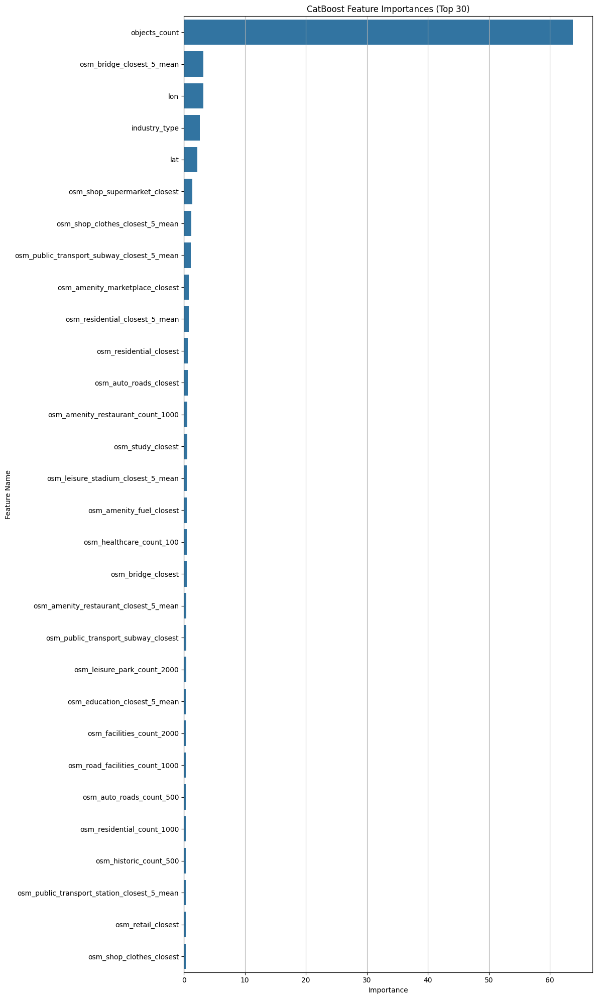

In [20]:
feature_importances = cb_model.get_feature_importance()
feature_names = X_train_cat.columns

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 20))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(30)) # Plot top 30 features for readability
plt.title('CatBoost Feature Importances (Top 30)')
plt.xlabel('Importance')
plt.ylabel('Feature Name')
plt.grid(axis='x')
plt.tight_layout()
plt.show()

Вывод  
В нашем датасете есть данные по транзакциям со всей России  
Видны кластеры из точек в крупных городах/областных центрах.  
Данные не идеальны, существуют подозрительны, например, город Удачный р. Якутия с населением 13 тыс людей имеет среднюю сумму транзакций в 46 млн руб.

# Этап 2

## 2.1 Работа с аномалиями и выбросами

In [21]:
train.columns

Index(['h3_index', 'industry_type', 'transaction_count', 'customer_count',
       'objects_count', 'transaction_sum', 'lat', 'lon',
       'osm_accommodation_closest', 'osm_accommodation_closest_5_mean',
       ...
       'osm_tourism_hotel_count_100', 'osm_tourism_hotel_count_1000',
       'osm_tourism_hotel_count_2000', 'osm_tourism_hotel_count_500',
       'osm_transportation_closest', 'osm_transportation_closest_5_mean',
       'osm_transportation_count_100', 'osm_transportation_count_1000',
       'osm_transportation_count_2000', 'osm_transportation_count_500'],
      dtype='object', length=344)

Q1: 1.00
Q3: 4.00
IQR: 3.00
Lower bound: -3.50
Upper bound: 8.50

Number of IQR : 20936
Number of Z-score (threshold=3): 630


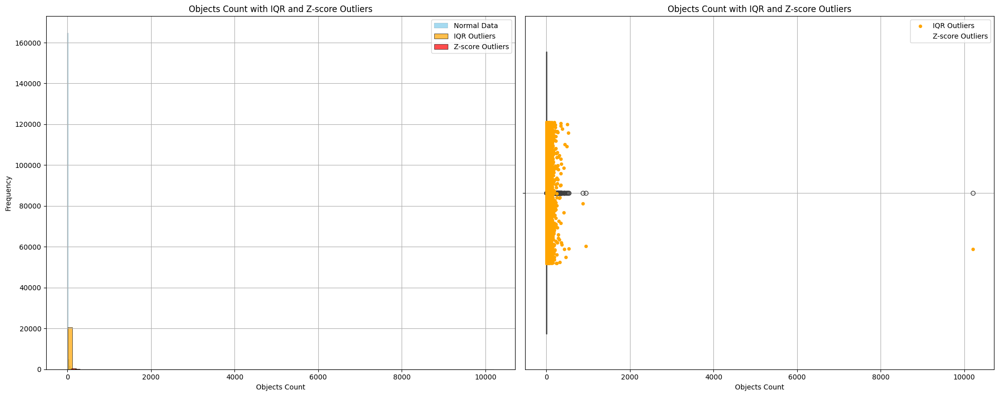

In [22]:
Q1 = train['objects_count'].quantile(0.25)
Q3 = train['objects_count'].quantile(0.75)
IQR = Q3 - Q1

lower_bound_iqr = Q1 - 1.5 * IQR
upper_bound_iqr = Q3 + 1.5 * IQR
train['is_objects_count_iqr_outlier'] = ((train['objects_count'] < lower_bound_iqr) | (train['objects_count'] > upper_bound_iqr))

mean_objects_count = train['objects_count'].mean()
std_objects_count = train['objects_count'].std()
z_score_threshold = 3
train['objects_count_zscore'] = (train['objects_count'] - mean_objects_count) / std_objects_count
train['is_objects_count_zscore_outlier'] = np.abs(train['objects_count_zscore']) > z_score_threshold

print(f"Q1: {Q1:.2f}")
print(f"Q3: {Q3:.2f}")
print(f"IQR: {IQR:.2f}")
print(f"Lower bound: {lower_bound_iqr:.2f}")
print(f"Upper bound: {upper_bound_iqr:.2f}")
print()
print(f"Number of IQR : {train['is_objects_count_iqr_outlier'].sum()}")
print(f"Number of Z-score (threshold={z_score_threshold}): {train['is_objects_count_zscore_outlier'].sum()}")

iqr_outliers = train[train['is_objects_count_iqr_outlier']]['objects_count']
zscore_outliers = train[train['is_objects_count_zscore_outlier']]['objects_count']

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.histplot(train['objects_count'], bins=500, kde=False, color='skyblue', label='Normal Data', ax=axes[0])
sns.histplot(iqr_outliers, bins=100, kde=False, color='orange', label='IQR Outliers', alpha=0.7, ax=axes[0])
sns.histplot(zscore_outliers, bins=100, kde=False, color='red', label='Z-score Outliers', alpha=0.7, ax=axes[0])
axes[0].set_title('Objects Count with IQR and Z-score Outliers')
axes[0].set_xlabel('Objects Count')
axes[0].set_ylabel('Frequency')
axes[0].legend()
axes[0].grid(True)

sns.boxplot(x=train['objects_count'], ax=axes[1])
sns.stripplot(x=iqr_outliers, color='orange', jitter=0.2, size=5, marker='o', label='IQR Outliers', ax=axes[1])
sns.stripplot(x=zscore_outliers, color='red', jitter=0.2, size=5, marker='x', label='Z-score Outliers', ax=axes[1])
axes[1].set_title('Objects Count with IQR and Z-score Outliers')
axes[1].set_xlabel('Objects Count')
# axes[1].set_xscale('log') # Removed log scale, add if needed based on distribution
axes[1].legend()
axes[1].grid(True)
plt.tight_layout()
plt.show()

In [23]:
val['is_objects_count_iqr_outlier'] = ((val['objects_count'] < lower_bound_iqr) | (val['objects_count'] > upper_bound_iqr))
test['is_objects_count_iqr_outlier'] = ((test['objects_count'] < lower_bound_iqr) | (test['objects_count'] > upper_bound_iqr))

val['objects_count_zscore'] = (val['objects_count'] - mean_objects_count) / std_objects_count
val['is_objects_count_zscore_outlier'] = np.abs(val['objects_count_zscore']) > z_score_threshold

test['objects_count_zscore'] = (test['objects_count'] - mean_objects_count) / std_objects_count
test['is_objects_count_zscore_outlier'] = np.abs(test['objects_count_zscore']) > z_score_threshold

print(f"Validation set IQR outliers: {val['is_objects_count_iqr_outlier'].sum()}")
print(f"Validation set Z-score outliers: {val['is_objects_count_zscore_outlier'].sum()}")
print(f"Test set IQR outliers: {test['is_objects_count_iqr_outlier'].sum()}")
print(f"Test set Z-score outliers: {test['is_objects_count_zscore_outlier'].sum()}")

Validation set IQR outliers: 6905
Validation set Z-score outliers: 202
Test set IQR outliers: 6761
Test set Z-score outliers: 210


Были добавлены новые фичи, показывающие наличие аномалий в количестве объектов рядом с точкой бизнеса.

--- Isolation Forest ---
Isolation Forest outliers in train set: 1724
Isolation Forest outliers in validation set: 575
Isolation Forest outliers in test set: 601


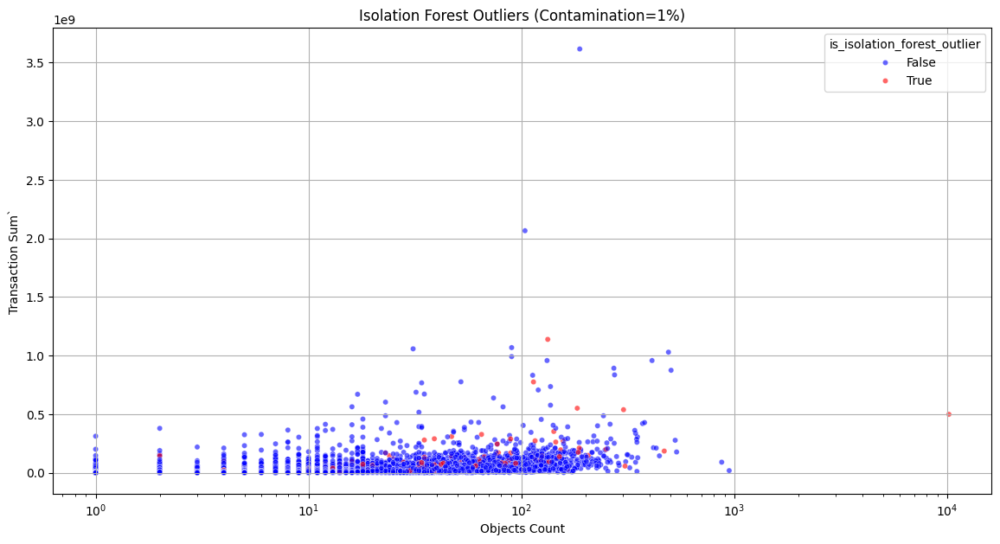

In [24]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

X_train_outliers = X_train.drop(columns=["industry_type"])
X_val_outliers = X_val.drop(columns=["industry_type"])
X_test_outliers = X_test.drop(columns=["industry_type"])

contamination_rate = 0.01

print("--- Isolation Forest ---")
iso_forest = IsolationForest(random_state=42, contamination=contamination_rate)
iso_forest.fit(X_train_outliers)

train['is_isolation_forest_outlier'] = iso_forest.predict(X_train_outliers)
val['is_isolation_forest_outlier'] = iso_forest.predict(X_val_outliers)
test['is_isolation_forest_outlier'] = iso_forest.predict(X_test_outliers)

train['is_isolation_forest_outlier'] = train['is_isolation_forest_outlier'].map({-1: True, 1: False})
val['is_isolation_forest_outlier'] = val['is_isolation_forest_outlier'].map({-1: True, 1: False})
test['is_isolation_forest_outlier'] = test['is_isolation_forest_outlier'].map({-1: True, 1: False})

print(f"Isolation Forest outliers in train set: {train['is_isolation_forest_outlier'].sum()}")
print(f"Isolation Forest outliers in validation set: {val['is_isolation_forest_outlier'].sum()}")
print(f"Isolation Forest outliers in test set: {test['is_isolation_forest_outlier'].sum()}")

plt.figure(figsize=(14, 7))
sns.scatterplot(
    data=train,
    x='objects_count',
    y='transaction_sum',
    hue='is_isolation_forest_outlier',
    palette={True: 'red', False: 'blue'},
    alpha=0.6,
    s=20
)
plt.title(f'Isolation Forest Outliers (Contamination={contamination_rate*100:.0f}%)')
plt.xlabel('Objects Count')
plt.ylabel('Transaction Sum`')
plt.xscale('log')
plt.grid(True)
plt.show()

In [25]:
iqr_outliers_count = train['is_objects_count_iqr_outlier'].sum()
zscore_outliers_count = train['is_objects_count_zscore_outlier'].sum()
isolation_forest_outliers_count = train['is_isolation_forest_outlier'].sum()

print(f"Total IQR outliers: {iqr_outliers_count}")
print(f"Total Z-score outliers: {zscore_outliers_count}")
print(f"Total Isolation Forest outliers: {isolation_forest_outliers_count}")

anomaly_flags = train[['is_objects_count_iqr_outlier', 'is_objects_count_zscore_outlier', 'is_isolation_forest_outlier']]

all_three_outliers = (anomaly_flags['is_objects_count_iqr_outlier'] &
                      anomaly_flags['is_objects_count_zscore_outlier'] &
                      anomaly_flags['is_isolation_forest_outlier']).sum()
print(f"\nAnomalies identified by all three methods: {all_three_outliers}")

iqr_zscore_only = (anomaly_flags['is_objects_count_iqr_outlier'] &
                   anomaly_flags['is_objects_count_zscore_outlier'] &
                   ~anomaly_flags['is_isolation_forest_outlier']).sum()
iqr_iso_only = (anomaly_flags['is_objects_count_iqr_outlier'] &
                  ~anomaly_flags['is_objects_count_zscore_outlier'] &
                  anomaly_flags['is_isolation_forest_outlier']).sum()
zscore_iso_only = (~anomaly_flags['is_objects_count_iqr_outlier'] &
                   anomaly_flags['is_objects_count_zscore_outlier'] &
                   anomaly_flags['is_isolation_forest_outlier']).sum()
exactly_two_outliers = iqr_zscore_only + iqr_iso_only + zscore_iso_only
print(f"Anomalies identified by exactly two methods: {exactly_two_outliers}")

iqr_only = (anomaly_flags['is_objects_count_iqr_outlier'] &
            ~anomaly_flags['is_objects_count_zscore_outlier'] &
            ~anomaly_flags['is_isolation_forest_outlier']).sum()
zscore_only = (~anomaly_flags['is_objects_count_iqr_outlier'] &
               anomaly_flags['is_objects_count_zscore_outlier'] &
               ~anomaly_flags['is_isolation_forest_outlier']).sum()
iso_only = (~anomaly_flags['is_objects_count_iqr_outlier'] &
            ~anomaly_flags['is_objects_count_zscore_outlier'] &
            anomaly_flags['is_isolation_forest_outlier']).sum()
exactly_one_outlier = iqr_only + zscore_only + iso_only
print(f"Anomalies identified by exactly one method: {exactly_one_outlier}")

any_outlier = (anomaly_flags['is_objects_count_iqr_outlier'] |
               anomaly_flags['is_objects_count_zscore_outlier'] |
               anomaly_flags['is_isolation_forest_outlier']).sum()
print(f"Total unique anomalies (by at least one method): {any_outlier}")

Total IQR outliers: 20936
Total Z-score outliers: 630
Total Isolation Forest outliers: 1724

Anomalies identified by all three methods: 33
Anomalies identified by exactly two methods: 958
Anomalies identified by exactly one method: 21275
Total unique anomalies (by at least one method): 22266


In [26]:
X_train = train.drop(columns=cols_to_drop_train)
X_val = val.drop(columns=cols_to_drop_val)

X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=cat_features)
val_pool = Pool(X_val_cat, y_val, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

cb_preds_test = cb_model.predict(test.drop(columns=["h3_index", "transaction_sum"]))
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

0:	learn: 3572038.6816440	test: 3697519.1180848	best: 3697519.1180848 (0)	total: 595ms	remaining: 9m 54s
100:	learn: 2555907.8633068	test: 2693565.5000118	best: 2693565.5000118 (100)	total: 37.7s	remaining: 5m 35s
200:	learn: 2450937.7662496	test: 2593447.8406159	best: 2593447.8406159 (200)	total: 1m 13s	remaining: 4m 51s
300:	learn: 2406531.3192397	test: 2554262.5310564	best: 2554262.5310564 (300)	total: 1m 50s	remaining: 4m 15s
400:	learn: 2383612.2930821	test: 2536409.6128347	best: 2536409.6128347 (400)	total: 2m 38s	remaining: 3m 56s
500:	learn: 2362857.3004585	test: 2520344.9296676	best: 2520344.9296676 (500)	total: 3m 15s	remaining: 3m 14s
600:	learn: 2343342.9696803	test: 2506102.6398543	best: 2506102.6398543 (600)	total: 3m 50s	remaining: 2m 33s
700:	learn: 2328273.9854665	test: 2496301.3703641	best: 2496301.3703641 (700)	total: 4m 28s	remaining: 1m 54s
800:	learn: 2317802.7852408	test: 2491481.6926760	best: 2491480.9316542 (799)	total: 5m 6s	remaining: 1m 16s
900:	learn: 23049

### Финальный анализ и сравнение методов обнаружения аномалий

Сравнение методов: IQR выявил наибольшее количество аномалий (20936) из-за сильной скошенности `objects_count`. Z-оценка, напротив, была наиболее консервативна (630 аномалий), фокусируясь на самых экстремальных значениях. Isolation Forest занял промежуточное положение (1724 аноманий), находя многомерные выбросы, которые необязательно были экстремальными по одному признаку, но необычны в сочетании нескольких.

Расхождения: Эти методы обнаружили разные подмножества аномалий. Всего 33 точек были помечены всеми тремя методами, 958 — двумя, и 21275 — только одним. Это указывает на то, что каждый метод улавливает свою специфику аномального поведения.

Добавление этих фичей немного снизило качество модели на тесте

## Генерация признаков

In [27]:
target_encoding_map = train.groupby('industry_type')['transaction_sum'].mean().to_dict()

global_mean_transaction_sum = train['transaction_sum'].mean()

train['industry_type_encoded'] = train['industry_type'].map(target_encoding_map).fillna(global_mean_transaction_sum)
val['industry_type_encoded'] = val['industry_type'].map(target_encoding_map).fillna(global_mean_transaction_sum)
test['industry_type_encoded'] = test['industry_type'].map(target_encoding_map).fillna(global_mean_transaction_sum)

X_train = train.drop(columns=cols_to_drop_train + ['industry_type'])
X_val = val.drop(columns=cols_to_drop_val + ['industry_type'])

X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

# X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
# X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=[])
val_pool = Pool(X_val_cat, y_val, cat_features=[])

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

cb_preds_test = cb_model.predict(test.drop(columns=["h3_index", "transaction_sum", "industry_type"]))
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))


0:	learn: 3575304.7880613	test: 3700749.2729276	best: 3700749.2729276 (0)	total: 312ms	remaining: 5m 11s
100:	learn: 2569510.8637566	test: 2707609.4961467	best: 2707609.4961467 (100)	total: 26.9s	remaining: 3m 59s
200:	learn: 2455012.5175520	test: 2601761.2556401	best: 2601761.2556401 (200)	total: 51.8s	remaining: 3m 25s
300:	learn: 2412607.6035362	test: 2565007.5408297	best: 2565007.5408297 (300)	total: 1m 17s	remaining: 2m 59s
400:	learn: 2387850.4076267	test: 2545501.3315704	best: 2545501.3315704 (400)	total: 1m 42s	remaining: 2m 33s
500:	learn: 2366903.2936986	test: 2529696.8406679	best: 2529696.8406679 (500)	total: 2m 7s	remaining: 2m 7s
600:	learn: 2346645.3217330	test: 2514953.8316923	best: 2514953.8316923 (600)	total: 2m 33s	remaining: 1m 41s
700:	learn: 2331501.1604480	test: 2504843.9824769	best: 2504843.9824769 (700)	total: 2m 57s	remaining: 1m 15s
800:	learn: 2320592.3846838	test: 2497650.5026581	best: 2497650.5026581 (800)	total: 3m 22s	remaining: 50.3s
900:	learn: 2307134.

Target Encoding ухудшил скор, CatBoost с categorical фичами показал результат лучше

In [28]:
train.drop(columns=['industry_type_encoded'], inplace=True, errors='ignore')
val.drop(columns=['industry_type_encoded'], inplace=True, errors='ignore')
test.drop(columns=['industry_type_encoded'], inplace=True, errors='ignore')

In [29]:
from sklearn.neighbors import NearestNeighbors

def create_and_add_knn_features(df_to_add_to, df_fit_on, k, prefix="knn"):
    n_neighbors_to_request = k + 1 if df_to_add_to.index.equals(df_fit_on.index) else k
    nn_model = NearestNeighbors(n_neighbors=n_neighbors_to_request, algorithm='ball_tree')
    nn_model.fit(df_fit_on[['lat', 'lon']])

    distances, indices = nn_model.kneighbors(df_to_add_to[['lat', 'lon']])

    if df_to_add_to.index.equals(df_fit_on.index):
        distances = distances[:, 1:]
        indices = indices[:, 1:]

    df_to_add_to[f'{prefix}_{k}_transaction_sum_mean'] = df_fit_on.iloc[indices.flatten(), df_fit_on.columns.get_loc('transaction_sum')].values.reshape(indices.shape).mean(axis=1)
    df_to_add_to[f'{prefix}_{k}_transaction_count_mean'] = df_fit_on.iloc[indices.flatten(), df_fit_on.columns.get_loc('transaction_count')].values.reshape(indices.shape).mean(axis=1)
    df_to_add_to[f'{prefix}_{k}_customer_count_mean'] = df_fit_on.iloc[indices.flatten(), df_fit_on.columns.get_loc('customer_count')].values.reshape(indices.shape).mean(axis=1)
    df_to_add_to[f'{prefix}_{k}_distance_mean'] = distances.mean(axis=1)

    return df_to_add_to

k_values = [5, 10, 20]

print("Adding KNN features to train, val, and test datasets...")
for k in k_values:
    print(f"  - Creating KNN features for k={k}...")
    train = create_and_add_knn_features(train, train, k, prefix="knn")
    val = create_and_add_knn_features(val, train, k, prefix="knn")
    test = create_and_add_knn_features(test, train, k, prefix="knn")

Adding KNN features to train, val, and test datasets...
  - Creating KNN features for k=5...
  - Creating KNN features for k=10...
  - Creating KNN features for k=20...


In [30]:
X_train = train.drop(columns=cols_to_drop_train)
X_val = val.drop(columns=cols_to_drop_val)

X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=cat_features)
val_pool = Pool(X_val_cat, y_val, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

cb_preds_test = cb_model.predict(test.drop(columns=["h3_index", "transaction_sum"]))
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

0:	learn: 3562827.8576788	test: 3690407.4408967	best: 3690407.4408967 (0)	total: 377ms	remaining: 6m 16s
100:	learn: 2433780.7318427	test: 2680332.1791334	best: 2680332.1791334 (100)	total: 40.2s	remaining: 5m 58s
200:	learn: 2302505.7745150	test: 2586252.5586733	best: 2586252.5586733 (200)	total: 1m 16s	remaining: 5m 4s
300:	learn: 2263071.2952984	test: 2559294.3384047	best: 2559294.3384047 (300)	total: 1m 55s	remaining: 4m 28s
400:	learn: 2234766.8454337	test: 2544324.4485074	best: 2544324.4485074 (400)	total: 2m 33s	remaining: 3m 48s
500:	learn: 2197776.7800853	test: 2528935.4788049	best: 2528935.4788049 (500)	total: 3m 10s	remaining: 3m 10s
600:	learn: 2178818.7709062	test: 2520565.8700042	best: 2520565.8700042 (600)	total: 3m 48s	remaining: 2m 31s
700:	learn: 2158836.4058687	test: 2513844.6011475	best: 2513844.6011475 (700)	total: 4m 26s	remaining: 1m 53s
800:	learn: 2144536.3753818	test: 2510433.4254059	best: 2510433.4254059 (800)	total: 5m 3s	remaining: 1m 15s
900:	learn: 213205

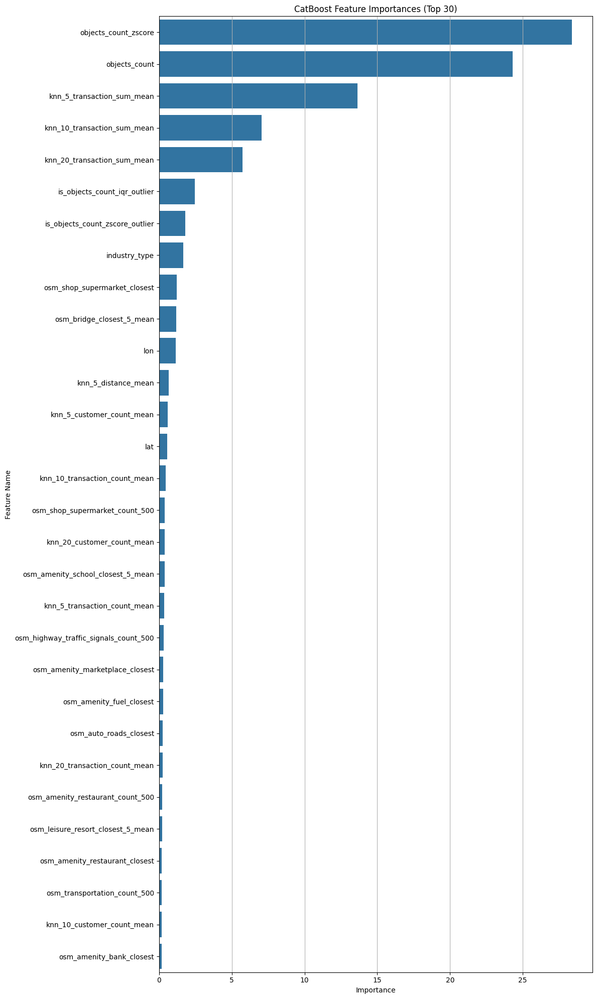

In [31]:
feature_importances = cb_model.get_feature_importance()
feature_names = X_train_cat.columns

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 20))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(30)) # Plot top 30 features for readability
plt.title('CatBoost Feature Importances (Top 30)')
plt.xlabel('Importance')
plt.ylabel('Feature Name')
plt.grid(axis='x')
plt.tight_layout()
plt.show()

In [32]:
def calculate_distance_to_point(df, target_lat, target_lon, lat_col='lat', lon_col='lon'):
    R = 6371

    lat1 = np.radians(df[lat_col])
    lon1 = np.radians(df[lon_col])
    lat2 = np.radians(target_lat)
    lon2 = np.radians(target_lon)

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    distance = R * c
    return distance

cities = {
    'moscow': (55.763263, 37.613748),
    'spb': (59.941821, 30.271526),
    'novosibirsk': (55.055589, 82.910959),
    'ekaterinburg': (56.882507, 60.543053),
    'krasnodar': (45.071133, 38.967710),
    'vladivostok': (43.168228, 131.873777),
    "yakutsk": (62.026605, 129.672211)
}

for city_name, coords in cities.items():
    train[f'dist_to_{city_name}'] = calculate_distance_to_point(train, coords[0], coords[1])
    val[f'dist_to_{city_name}'] = calculate_distance_to_point(val, coords[0], coords[1])
    test[f'dist_to_{city_name}'] = calculate_distance_to_point(test, coords[0], coords[1])

city_cols = [f'dist_to_{c}' for c in cities.keys()]
train['dist_to_closest_major_city'] = train[city_cols].min(axis=1)
val['dist_to_closest_major_city'] = val[city_cols].min(axis=1)
test['dist_to_closest_major_city'] = test[city_cols].min(axis=1)

In [33]:
X_train = train.drop(columns=cols_to_drop_train)
X_val = val.drop(columns=cols_to_drop_val)

X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=cat_features)
val_pool = Pool(X_val_cat, y_val, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

cb_preds_test = cb_model.predict(test.drop(columns=["h3_index", "transaction_sum"]))
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

0:	learn: 3569804.6779399	test: 3697166.2528832	best: 3697166.2528832 (0)	total: 387ms	remaining: 6m 26s
100:	learn: 2435673.1494680	test: 2674319.0131678	best: 2674319.0131678 (100)	total: 39.4s	remaining: 5m 50s
200:	learn: 2298288.9835131	test: 2581805.3750987	best: 2581805.3750987 (200)	total: 1m 16s	remaining: 5m 2s
300:	learn: 2254934.9340728	test: 2556477.4608145	best: 2556477.4608145 (300)	total: 1m 54s	remaining: 4m 26s
400:	learn: 2221892.7114274	test: 2541058.8117568	best: 2541058.8117568 (400)	total: 2m 34s	remaining: 3m 50s
500:	learn: 2189082.7641906	test: 2528056.0424276	best: 2528056.0424276 (500)	total: 3m 11s	remaining: 3m 11s
600:	learn: 2170678.4898089	test: 2518574.4229933	best: 2518553.9615302 (597)	total: 3m 50s	remaining: 2m 33s
700:	learn: 2152330.6312295	test: 2511967.5640648	best: 2511967.5640648 (700)	total: 4m 30s	remaining: 1m 55s
800:	learn: 2141737.7877463	test: 2508132.5313855	best: 2508132.5313855 (800)	total: 5m 9s	remaining: 1m 16s
900:	learn: 213129

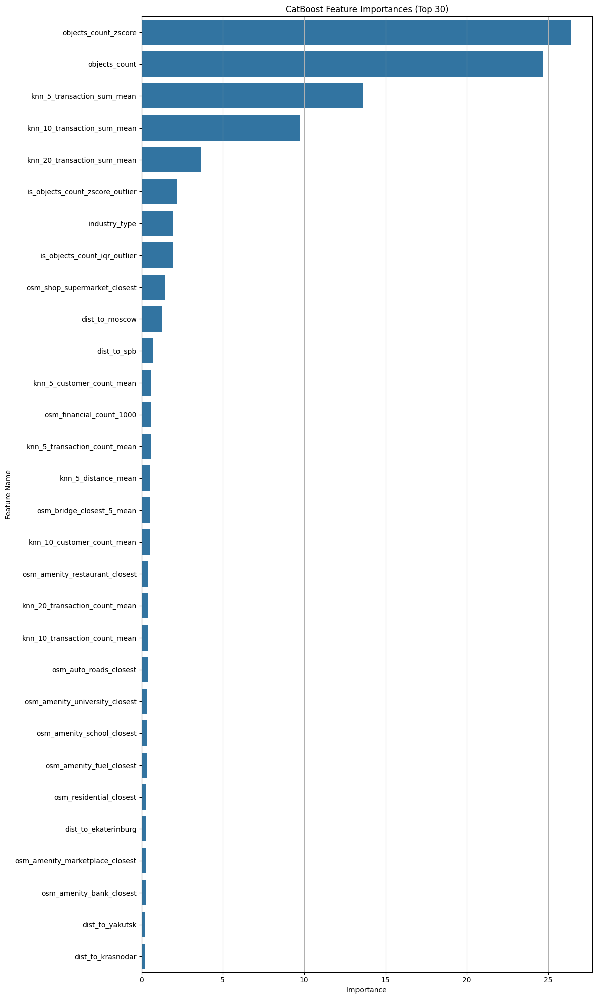

In [34]:
feature_importances = cb_model.get_feature_importance()
feature_names = X_train_cat.columns

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 20))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(30)) # Plot top 30 features for readability
plt.title('CatBoost Feature Importances (Top 30)')
plt.xlabel('Importance')
plt.ylabel('Feature Name')
plt.grid(axis='x')
plt.tight_layout()
plt.show()

In [35]:
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from sklearn.preprocessing import MinMaxScaler

correlations = train[num_features].corrwith(train['transaction_sum']).abs()
selected_corr = correlations[correlations > 0.05].index.tolist()
print(f"По корреляции отобрано: {len(selected_corr)}")

selector_anova = SelectKBest(f_regression, k=50)
X_num = train[num_features]
X_num = X_num.fillna(X_num.mean()).fillna(0)
selector_anova.fit(X_num, train['transaction_sum'])
selected_anova = X_num.columns[selector_anova.get_support()].tolist()
print(f"По ANOVA отобрано: {selected_anova}")

# Долго
# X_non_negative = MinMaxScaler().fit_transform(X_num)
# selector_mi = SelectKBest(mutual_info_regression, k=50)
# selector_mi.fit(X_non_negative, train['transaction_sum'])
# selected_mi = X_num.columns[selector_mi.get_support()].tolist()
# print(f"По Mutual Information отобрано: {selected_mi}")

По корреляции отобрано: 156
По ANOVA отобрано: ['objects_count', 'osm_amenity_bank_count_2000', 'osm_amenity_cafe_count_100', 'osm_amenity_cafe_count_2000', 'osm_amenity_cafe_count_500', 'osm_amenity_pharmacy_count_2000', 'osm_amenity_restaurant_count_100', 'osm_amenity_restaurant_count_1000', 'osm_amenity_restaurant_count_2000', 'osm_amenity_restaurant_count_500', 'osm_amenity_school_count_2000', 'osm_animals_count_2000', 'osm_auto_roads_count_1000', 'osm_auto_roads_count_2000', 'osm_auto_roads_count_500', 'osm_entertainment_count_2000', 'osm_financial_count_1000', 'osm_financial_count_2000', 'osm_financial_count_500', 'osm_healthcare_count_2000', 'osm_highway_crossing_count_1000', 'osm_highway_crossing_count_2000', 'osm_highway_crossing_count_500', 'osm_kids_count_100', 'osm_kids_count_1000', 'osm_kids_count_2000', 'osm_kids_count_500', 'osm_leisure_fitness_centre_count_2000', 'osm_leisure_park_count_2000', 'osm_leisure_sports_centre_count_2000', 'osm_office_count_500', 'osm_parking_

In [36]:
X_train = train[selected_corr + ["industry_type"]]
X_val = val[selected_corr + ["industry_type"]]

X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=cat_features)
val_pool = Pool(X_val_cat, y_val, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

cb_preds_test = cb_model.predict(test[selected_corr + ["industry_type"]])
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

0:	learn: 3576562.3378937	test: 3701914.4383574	best: 3701914.4383574 (0)	total: 229ms	remaining: 3m 49s
100:	learn: 2624020.1673275	test: 2763201.3645066	best: 2763201.3645066 (100)	total: 22.6s	remaining: 3m 21s
200:	learn: 2547317.1743659	test: 2693899.0709737	best: 2693899.0709737 (200)	total: 44.2s	remaining: 2m 55s
300:	learn: 2518911.5930815	test: 2672435.1414875	best: 2672435.1414875 (300)	total: 1m 8s	remaining: 2m 38s
400:	learn: 2498260.7889009	test: 2658604.4744707	best: 2658604.4744707 (400)	total: 1m 31s	remaining: 2m 16s
500:	learn: 2478167.3016035	test: 2646064.4059722	best: 2646064.4059722 (500)	total: 1m 54s	remaining: 1m 54s
600:	learn: 2461989.1664929	test: 2635278.3221749	best: 2635273.8052608 (595)	total: 2m 18s	remaining: 1m 31s
700:	learn: 2447680.1107515	test: 2628375.1123489	best: 2628375.1123489 (700)	total: 2m 41s	remaining: 1m 8s
800:	learn: 2439796.6719935	test: 2623407.4756011	best: 2623407.4756011 (800)	total: 3m 5s	remaining: 46.1s
900:	learn: 2431085.5

In [37]:
# Долго
# from sklearn.feature_selection import RFECV

# estimator = CatBoostRegressor(iterations=100, random_seed=42, verbose=0)
# selector = RFECV(estimator, step=1, cv=5, scoring='neg_mean_squared_error')
# selector = selector.fit(X_num, train['transaction_sum'])

# print(f"Оптимальное кол-во признаков: {selector.n_features_}")
# selected_rfecv = X_num.columns[selector.support_]

In [38]:
selected_feats_imp = importance_df.sort_values(by='Importance', ascending=False).head(50)["Feature"].tolist()

In [39]:
X_train = train[selected_feats_imp]
X_val = val[selected_feats_imp]

X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=cat_features)
val_pool = Pool(X_val_cat, y_val, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

cb_preds_test = cb_model.predict(test[selected_feats_imp])
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

0:	learn: 3569215.5349052	test: 3697341.8451565	best: 3697341.8451565 (0)	total: 144ms	remaining: 2m 23s
100:	learn: 2430896.0879405	test: 2676135.4296146	best: 2676135.4296146 (100)	total: 14.8s	remaining: 2m 12s
200:	learn: 2287570.3968290	test: 2577107.3839704	best: 2577107.3839704 (200)	total: 28.7s	remaining: 1m 54s
300:	learn: 2247568.6369220	test: 2554365.0545870	best: 2554365.0545870 (300)	total: 42.9s	remaining: 1m 39s
400:	learn: 2216183.0581819	test: 2538963.7968039	best: 2538963.7968039 (400)	total: 58.6s	remaining: 1m 27s
500:	learn: 2182640.4958622	test: 2527248.1116011	best: 2527248.1116011 (500)	total: 1m 13s	remaining: 1m 13s
600:	learn: 2161318.3169473	test: 2518380.0815826	best: 2518380.0815826 (600)	total: 1m 27s	remaining: 58.4s
700:	learn: 2143053.9140386	test: 2513293.3272037	best: 2513293.3272037 (700)	total: 1m 42s	remaining: 43.7s
800:	learn: 2126724.2970283	test: 2509412.1220290	best: 2509378.3931200 (799)	total: 1m 56s	remaining: 29s
900:	learn: 2114915.2582

Были сгенерированы признаки по ближайшим соседям, расстояния до разных ключевых городов, отобраны фичи по корреляции и важности модели.  
Все новые фичи улучшили качество модели.
Отобранные признаки по feature importance дали сильный прирост качества модели на тесте.

#Этап 3. Интерпретация и диагностика моделей

In [40]:
!pip install -qq lime shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [47]:
X_test = test[selected_feats_imp]
cat_features = ['industry_type']
num_features = [col for col in X_train.columns if col not in cat_features]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('scaler', StandardScaler())
        ]), num_features),
        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
        ]), cat_features)
    ]
)

X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

ohe_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(cat_features)
all_feature_names = np.concatenate([num_features, ohe_feature_names])

X_train_df = pd.DataFrame(X_train_processed, columns=all_feature_names)
X_test_df = pd.DataFrame(X_test_processed, columns=all_feature_names)

In [48]:
model_elastic = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)
model_elastic.fit(X_train_df, y_train)

model_cb = CatBoostRegressor(iterations=1000, verbose=0, random_state=42)
model_cb.fit(X_train_df, y_train)

Global SHAP: ElasticNet


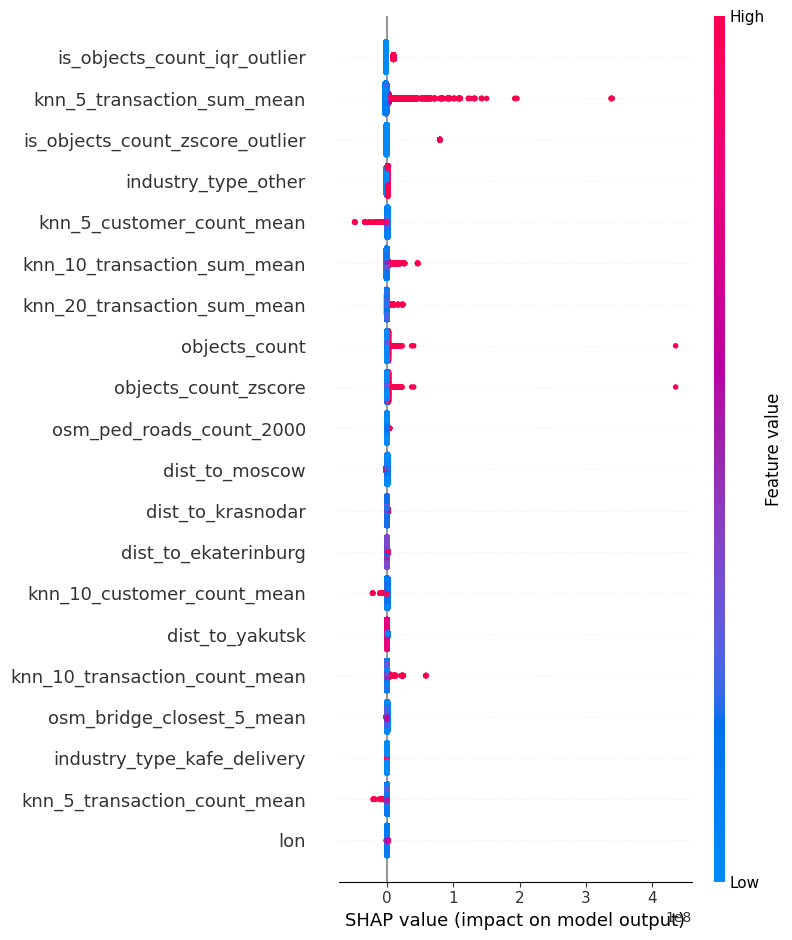

Global SHAP: CatBoost


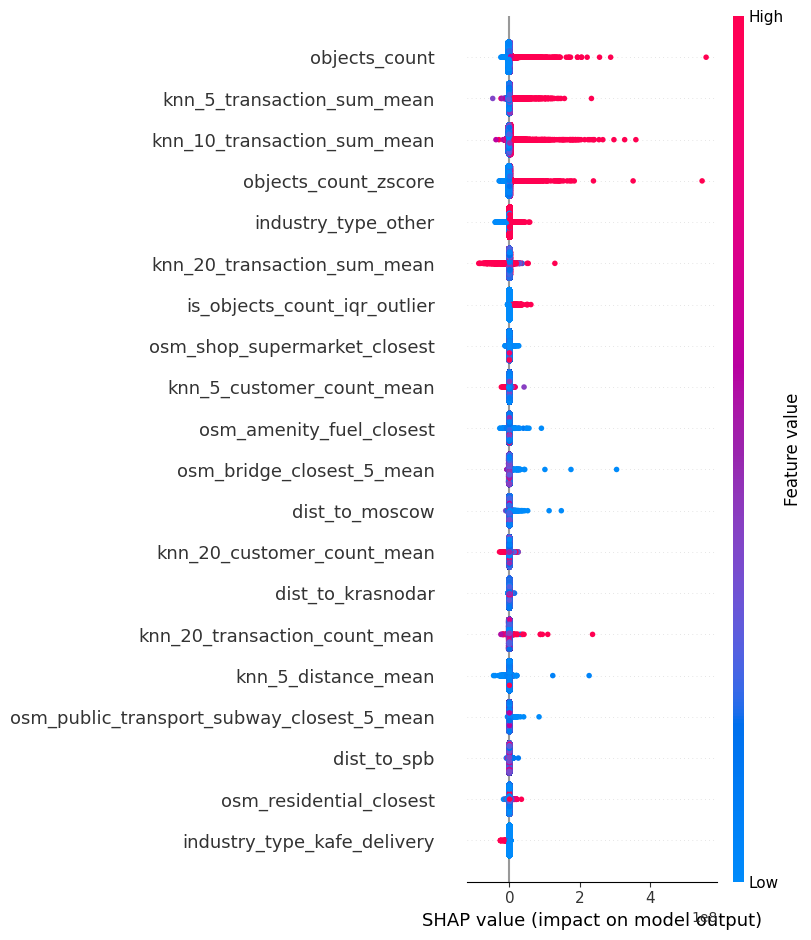

In [49]:
import shap

masker = shap.maskers.Independent(data=X_train_df)
explainer_elastic = shap.LinearExplainer(model_elastic, masker=masker)
shap_values_elastic = explainer_elastic(X_train_df)

print("Global SHAP: ElasticNet")
shap.summary_plot(shap_values_elastic, X_train_df)

explainer_cb = shap.TreeExplainer(model_cb)
shap_values_cb = explainer_cb(X_train_df)

print("Global SHAP: CatBoost")
shap.summary_plot(shap_values_cb, X_train_df)

In [50]:
import lime
import lime.lime_tabular

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_df),
    feature_names=all_feature_names,
    class_names=['target'],
    mode='regression'
)

def get_global_lime_importance(model, X_sample, n_features=10):
    importances = {}

    for i in range(min(100, len(X_sample))):
        exp = explainer_lime.explain_instance(
            X_sample.iloc[i].values,
            model.predict,
            num_features=n_features
        )
        for feature, weight in exp.as_list():
            feat_name = feature.split(' <')[0].split(' >')[0].split('=')[0].strip()
            if feat_name not in importances:
                importances[feat_name] = []
            importances[feat_name].append(abs(weight))

    avg_importance = {k: np.mean(v) for k, v in importances.items()}
    return pd.Series(avg_importance).sort_values(ascending=False)

lime_global_elastic = get_global_lime_importance(model_elastic, X_train_df)
lime_global_cb = get_global_lime_importance(model_cb, X_train_df)

print("Top 5 Global LIME Features (ElasticNet):\n", lime_global_elastic.head(5))
print("Top 5 Global LIME Features (CatBoost):\n", lime_global_cb.head(5))

Top 5 Global LIME Features (ElasticNet):
 is_objects_count_zscore_outlier    7.276115e+07
is_objects_count_iqr_outlier       9.827842e+06
knn_5_transaction_sum_mean         6.691796e+06
-0.33                              3.434014e+06
-0.23                              2.374319e+06
dtype: float64
Top 5 Global LIME Features (CatBoost):
 0.00                           1.739266e+07
industry_type_other            1.732955e+07
knn_10_transaction_sum_mean    1.655049e+07
knn_5_transaction_sum_mean     1.640643e+07
-0.25                          1.077595e+07
dtype: float64


Interpreting Observation #0
True Value: 170796.2
ElasticNet Prediction: 2104406.94
CatBoost Prediction: 3002995.23
Local SHAP (ElasticNet):


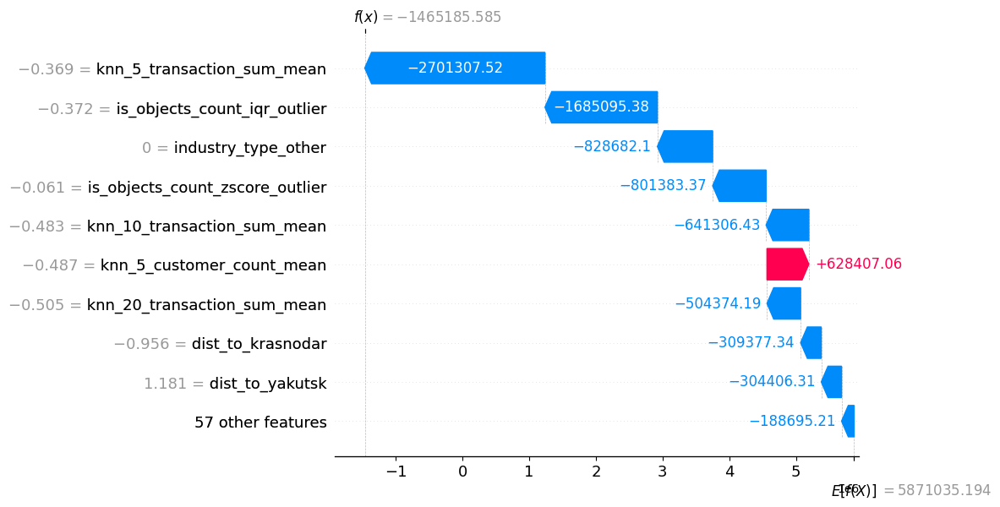

Local SHAP (CatBoost):


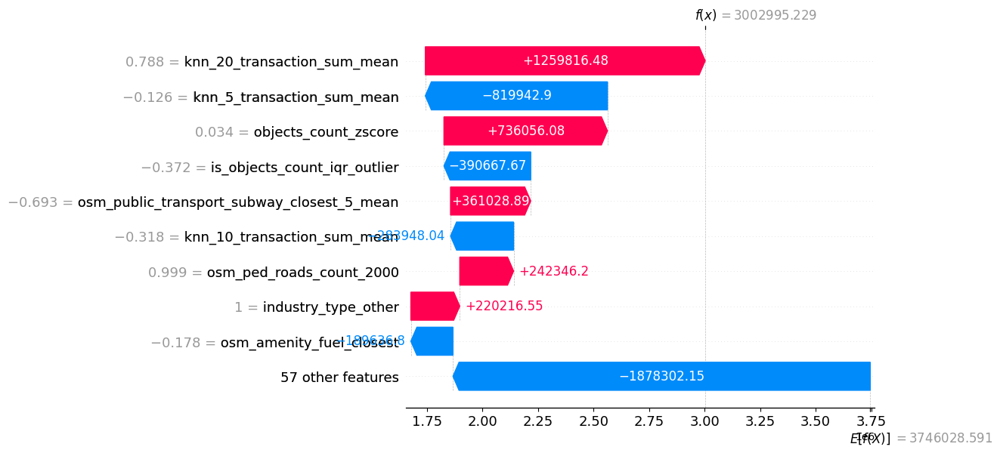

Local LIME (ElasticNet):


Local LIME (CatBoost):


In [51]:
idx = 0
observation = X_test_df.iloc[[idx]]
observation_values = X_test_df.iloc[idx].values
true_value = y_test.iloc[idx] if hasattr(y_test, 'iloc') else y_test[idx]

print(f"Interpreting Observation #{idx}")
print(f"True Value: {true_value}")
print(f"ElasticNet Prediction: {model_elastic.predict(observation)[0]:.2f}")
print(f"CatBoost Prediction: {model_cb.predict(observation)[0]:.2f}")

print("Local SHAP (ElasticNet):")
shap.plots.waterfall(shap_values_elastic[idx])

print("Local SHAP (CatBoost):")
shap_values_cb_local = explainer_cb(observation)
shap.plots.waterfall(shap_values_cb_local[0])


print("Local LIME (ElasticNet):")
exp_lime_el = explainer_lime.explain_instance(
    observation_values,
    model_elastic.predict,
    num_features=10
)
exp_lime_el.show_in_notebook(show_table=True)

print("Local LIME (CatBoost):")
exp_lime_cb = explainer_lime.explain_instance(
    observation_values,
    model_cb.predict,
    num_features=10
)
exp_lime_cb.show_in_notebook(show_table=True)

Оба метода выделили схожую важность признаков

In [52]:
def get_shap_embeddings(model, X):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)
    return shap_values

shap_embeddings_train = get_shap_embeddings(model_cb, X_train_df)
shap_embeddings_test = get_shap_embeddings(model_cb, X_test_df)

print(f"SHAP Embeddings shape: {shap_embeddings_train.shape}")

SHAP Embeddings shape: (172513, 66)


In [59]:
iso = IsolationForest(contamination=0.01, random_state=42)
outliers = iso.fit_predict(shap_embeddings_train)

mask_clean = outliers == 1

print(f"Original Train Size: {len(X_train_df)}")
print(f"Cleaned Train Size: {sum(mask_clean)}")

X_train_clean = train[mask_clean]
y_train_clean = y_train[mask_clean]

X_train = X_train_clean[selected_feats_imp]
X_val = val[selected_feats_imp]

X_train_cat = X_train.copy()
X_val_cat = X_val.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")
X_val_cat[cat_features] = X_val_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train_clean, cat_features=cat_features)
val_pool = Pool(X_val_cat, y_val, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool, eval_set=val_pool)

cb_preds = cb_model.predict(val_pool)
cb_score = mae_log10(y_val, cb_preds)

print(f"Model: CatBoost")
print(f"MAE LOG10 Score: {cb_score:.5f}")

cb_preds_test = cb_model.predict(test[selected_feats_imp])
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

Original Train Size: 172513
Cleaned Train Size: 170787
0:	learn: 2745948.8797658	test: 3701891.2788079	best: 3701891.2788079 (0)	total: 351ms	remaining: 5m 50s
100:	learn: 1871792.8409430	test: 2746712.6154151	best: 2746712.6154151 (100)	total: 17.6s	remaining: 2m 36s
200:	learn: 1808866.3740145	test: 2664866.1069857	best: 2664866.1069857 (200)	total: 31.7s	remaining: 2m 6s
300:	learn: 1786610.3584555	test: 2639254.9579094	best: 2639254.9579094 (300)	total: 46.3s	remaining: 1m 47s
400:	learn: 1768587.9953310	test: 2621285.6798555	best: 2621285.6798555 (400)	total: 1m 1s	remaining: 1m 32s
500:	learn: 1755126.6906662	test: 2609449.9208519	best: 2609449.9208519 (500)	total: 1m 16s	remaining: 1m 16s
600:	learn: 1742269.3267727	test: 2600734.7172294	best: 2600734.7172294 (600)	total: 1m 31s	remaining: 1m
700:	learn: 1732253.7304410	test: 2592668.9393249	best: 2592668.9393249 (700)	total: 1m 47s	remaining: 46s
800:	learn: 1721040.0177879	test: 2586926.6987683	best: 2586926.6987683 (800)	tota

Удаление аномалий по шап значениям чуть улучшило качество (0.5358 -> 0.5350)

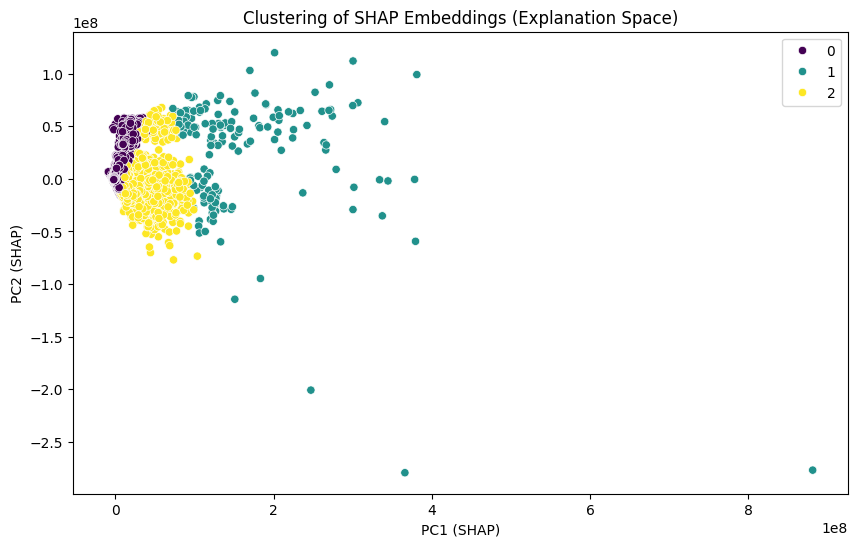

In [61]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
shap_pca = pca.fit_transform(shap_embeddings_train)

n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
train_clusters = kmeans.fit_predict(shap_embeddings_train)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=shap_pca[:, 0], y=shap_pca[:, 1], hue=train_clusters, palette='viridis')
plt.title('Clustering of SHAP Embeddings (Explanation Space)')
plt.xlabel('PC1 (SHAP)')
plt.ylabel('PC2 (SHAP)')
plt.show()

In [65]:
X_train_augmented = train.drop(columns=cols_to_drop_train).copy()
X_test_augmented = test.drop(columns=cols_to_drop_val).copy()

X_train_augmented['shap_cluster'] = train_clusters

test_clusters = kmeans.predict(shap_embeddings_test)
X_test_augmented['shap_cluster'] = test_clusters

X_train_augmented['shap_cluster'] = X_train_augmented['shap_cluster'].astype('str')
X_test_augmented['shap_cluster'] = X_test_augmented['shap_cluster'].astype('str')

cat_features_indices = np.where(X_train_augmented.dtypes == object)[0]

model_cb_aug = CatBoostRegressor(iterations=1000, verbose=0, random_state=42,
                                 cat_features=['shap_cluster'] + cat_features)

model_cb_aug.fit(X_train_augmented, y_train)

X_train = X_train_augmented[selected_feats_imp]

X_train_cat = X_train.copy()

X_train_cat[cat_features] = X_train_cat[cat_features].fillna("Missing")

train_pool = Pool(X_train_cat, y_train, cat_features=cat_features)

cb_model = CatBoostRegressor(
    loss_function='MAE',
    eval_metric='MAE',
    verbose=100,
    random_seed=42,
)

cb_model.fit(train_pool)

cb_preds_test = cb_model.predict(X_test_augmented[selected_feats_imp])
cb_score_test = mae_log10(test["transaction_sum"], cb_preds_test)
print("CatBoost test:")
print("Log10 MAE:", cb_score_test, "LB Score", 1 / (1 + cb_score_test))

cluster_interpretation = X_train_df.copy()
cluster_interpretation['cluster'] = train_clusters
print("\nCluster Profiling (Mean values per cluster):")
print(cluster_interpretation.groupby('cluster').mean())

0:	learn: 3569215.5349052	total: 153ms	remaining: 2m 32s
100:	learn: 2430896.0879405	total: 14s	remaining: 2m 4s
200:	learn: 2287570.3968290	total: 27.3s	remaining: 1m 48s
300:	learn: 2247568.6369220	total: 40.8s	remaining: 1m 34s
400:	learn: 2216183.0581819	total: 54.4s	remaining: 1m 21s
500:	learn: 2182640.4958622	total: 1m 8s	remaining: 1m 8s
600:	learn: 2161318.3169473	total: 1m 22s	remaining: 54.7s
700:	learn: 2143053.9140386	total: 1m 36s	remaining: 41.1s
800:	learn: 2126724.2970283	total: 1m 49s	remaining: 27.3s
900:	learn: 2114915.2582983	total: 2m 3s	remaining: 13.6s
999:	learn: 2104223.1311983	total: 2m 18s	remaining: 0us
CatBoost test:
Log10 MAE: 0.5355819842689483 LB Score 0.651218893060975

Cluster Profiling (Mean values per cluster):
         objects_count_zscore  objects_count  knn_5_transaction_sum_mean  \
cluster                                                                    
0                   -0.055796      -0.055796                   -0.041468   
1             

Кластеры по shap эмбеддингам прироста не дали